# Zadanie domowe

W przypadku obrazów w odcieniach szarości pojedynczy piksel z zakresu [0; 255] reprezentowany jest jako 8-bitowa liczba bez znaku.
Pewnym rozszerzeniem analizy sposobu reprezentacji obrazu może być następujący eksperyment.
Załóżmy, że z każdego z 8 bitów możemy stworzyć pojedynczy obraz binarny (ang. _bit-plane slicing_).
Dla obrazka _100zloty.jpg_ (https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/100zloty.jpg) stwórz 8 obrazów, z których każdy powinien zawierać jedną płaszczyznę bitową.
Podpowiedź $-$ warto sprawdzić, jak realizuje się bitowe operacje logiczne.
Zastosowanie takiej dekompozycji obrazu pozwala na analizę ,,ważności'' poszczególnych bitów.
Jest to użyteczne w kwantyzacji, ale także w kompresji.

In [1]:
import cv2
import os
import requests
import matplotlib.pyplot as plt
import numpy as np

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/'
FILENAME = '100zloty.jpg'
if not os.path.exists(FILENAME) :
    r = requests.get(url + FILENAME, allow_redirects=True)
    open(FILENAME, 'wb').write(r.content)

## Obraz

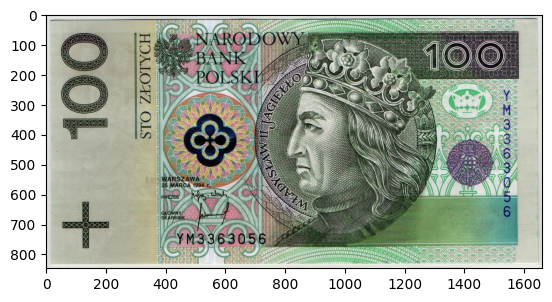

In [2]:
image = cv2.imread(FILENAME)

plt.imshow(image)

## Pojedyncza przestrzeń bitowa

In [3]:
def get_nth_bit(image, n: int, normalized: bool = True):
    filtered_image = (image & (2 ** n))
    if normalized:
        filtered_image //= (2 ** n)
        filtered_image *= 255
    return filtered_image

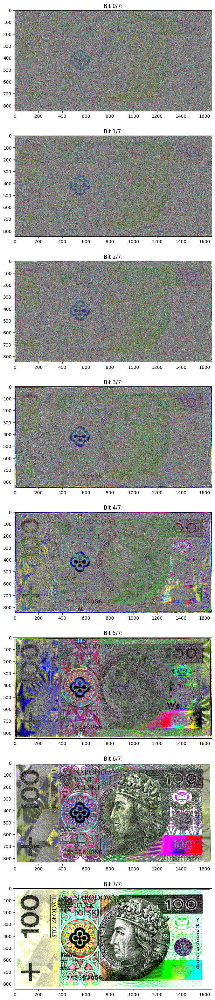

In [4]:
BASIC_DATASIZE = 8

fig, axs = plt.subplots(nrows = BASIC_DATASIZE, figsize = (8, 40))

for i in range(BASIC_DATASIZE):
    fitered_image =  get_nth_bit(image, i)
    ax = axs[i]

    ax.imshow(fitered_image)
    ax.set_title(f"Bit {i}/{BASIC_DATASIZE - 1}:")

## Odtwarzanie obrazu oryginalnego

W drugim etapie zadania proszę spróbować odtworzyć obraz oryginalny z mniejszej liczby obrazów binarnych.
Warto zacząć od dwóch najbardziej znaczących bitów, a później dodawać kolejne.
Należy utworzyć co najmniej trzy wersje zrekonstruowanych obrazów.
Podpowiedź $-$ rekonstrukcja obrazu to mnożenie przez odpowiednią potęgę liczby 2 (przesunięcie bitowe) oraz dodawanie.

In [5]:
single_bit_images = [get_nth_bit(image, i, normalized = False) for i in range(BASIC_DATASIZE - 1, -1, -1)]

composed_images = single_bit_images[:1]

for i in range(1, BASIC_DATASIZE):
    composed_images.append(
        composed_images[-1] + single_bit_images[i]
    )

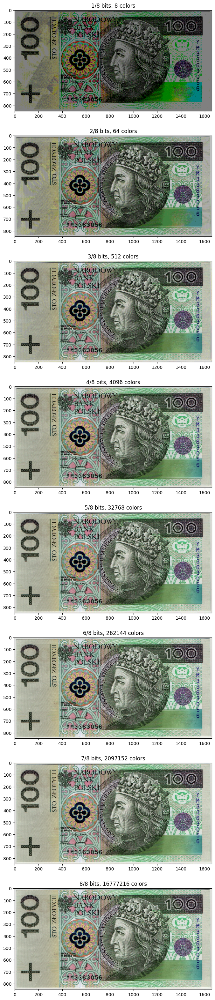

In [6]:
NUMBER_OF_CHANNELS = 3

fig, axs = plt.subplots(nrows = BASIC_DATASIZE, figsize = (8, 40))

for i, composed_image in enumerate(composed_images):
    ax = axs[i]

    ax.set_title(f"{i + 1}/{BASIC_DATASIZE} bits, {2 ** ((i + 1) * NUMBER_OF_CHANNELS)} colors")
    ax.imshow(composed_image)